In [1]:
import numpy as np
import matplotlib.pyplot as plt 
from matplotlib import rcParams
from matplotlib.ticker import (MultipleLocator, AutoMinorLocator)
rcParams['axes.linewidth']=2
rcParams['text.usetex']=True#True
fs =25
#path = "/home/jalil/Projects2023/TDNEGF/TDNEGF/data/"
path = "./data"
name1 = 'res_U0_w12'
name2 = 'res_U01_w12'
name3 = 'res_U05_w12'
name4 = 'res_U0_w05'
name5 = 'res_U01_w05'
name6 = 'res_U05_w05'

In [23]:
name1 = "L10_Jex_01_z_02_U05_nomag"##"L10_Jex_1_z_00" #name3#'test_10' #'aferro_omega_06'#'ferro_omega_12' #'NiPt_soc_ndis'#'disc_abov1f_so01_n20'#'disc_abovf_so01_n20'#'NiPt_soc_30'#'ttest_30'#'NiPt_soc_ndis' #'NiPt3_soc' #'NiPt_soc_ndis'#'NiPt3_nosoc'#'NiPt15_nosoc'#"curr_gene2_soc" ## test
#--------------------------------------------------------- Data from the TDNEGF code
cspins_f = np.loadtxt(f"{path}/cspins_{name1}_jl.txt" )
sneq_f = np.loadtxt(f"{path}/sneq_{name1}_jl.txt" )
seq_f = np.loadtxt(f"{path}/seq_{name1}_jl.txt" )
sc_f = np.loadtxt(f"{path}/sc_{name1}_jl.txt" )
cc_f = np.loadtxt(f"{path}/cc_{name1}_jl.txt" ) ;
#---------------------------------------------------------- Data for the density and the bond current
bcurr_f = np.loadtxt(f"{path}/bcurr_{name1}_jl.txt" ) 
cden_f = np.loadtxt(f"{path}/cden_{name1}_jl.txt" ) 
#---------------------------------------------------------- Data of the spin liquid 
#ent_f = np.loadtxt(f"./data/entropy_{name1}_sl_jl.txt" ) 
#spin liquid data
#sden_sl_f = np.loadtxt(f"./data/sden_{name1}_sl_jl.txt")  

In [24]:
def fourier_transform(times,data,dt):
    """ This function calculates the FFT tranformation of a set of data
    """
    from scipy.fft import fft, fftfreq ### Import functions to make the FFT
    N = times.size                     ### Calculate the size of the data set
    # This computes the complex Fourier coeffients, representing
    #  the amplitude and phase information for each frquency
    yif = np.fft.fft(data)             ### Apply the FFT algorithm to the data 
    yf = abs(yif[0:N//2])              ### We only consider the first half of the spectrum
                                       ### since the FFT output is symmetric due to the propt.
                                       ### of real input signals
    yf= (2/N)*yf                       ### Normalice the amplitudes and the factor of two 
                                       ### accounts for the symmetry in the spectrum are properly scaled 
    # This Calculates the optimal frequencies based on the number of data points and the time interval 
    # between consecutive points
    xf = np.fft.fftfreq(N,dt)[0:N//2]  ### Generates the correspoding frqeuncy values for each data point 
    return xf, yf

# TDNEGF data

# Total current and current in the leads 

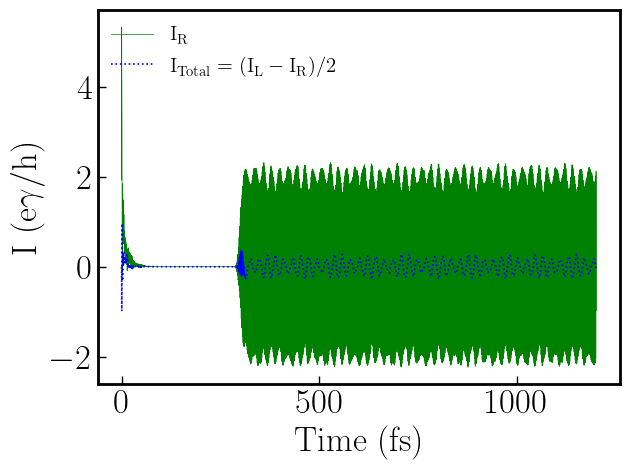

In [25]:
fig,axs = plt.subplots(1,1)
#plt.plot(data[f"cspins_f_{name1}"][:,0],data[f"cspins_f_{name1}"][:,13])


# axs.plot(cc_f[:,0],cc_f[:,1],color= 'tab:blue',lw = 0.5)#,label = r'$\hbar\omega_0 = 0.6\mathrm{E_{gap}}$')
# axs.plot(cc_f[:,0],cc_f[:,2],color= 'tab:orange',lw = 0.5)#
# axs.plot(cc_f[:,0],cc_f[:,3],color= 'tab:red',lw = 0.5)#
#axs.plot(cc_f[:,0],cc1_f[:,1],color= 'tab:orange',lw = 0.5,label = r'$\hbar\omega_0 = 1.2\mathrm{E_{gap}}$',alpha=0.7)

axs.plot(cc_f[:,0],cc_f[:,2],color= 'green',lw = 0.5,label = r'$\mathrm{I_R}$')
axs.plot(cc_f[:,0],(cc_f[:,1]-cc_f[:,2])/2,color= 'blue',ls = ':' ,lw = 1.2,alpha= 1.0 ,label = r'$\mathrm{I_{Total} = (I_L - I_R)/2 }$')
axs.set_ylabel(r"$\mathrm{I\ (e\gamma/h)}$", fontsize = fs)
axs.set_xlabel(r"$\mathrm{Time\ (fs)}$",fontsize = fs)
#axs.set_ylim([-8e-6,8e-6])
#axs.set_ylim([-40e-1,40e-1])
axs.tick_params(axis='both', which='both', labelsize=fs,direction='in', length=6,width=1)
axs.ticklabel_format(axis="y", style="sci", scilimits=(-1,2), useMathText=True)
axs.yaxis.offsetText.set_fontsize(fs)
#axs.set_xlim([350,800])
#axs.set_xlim([7000,8000])
plt.legend(frameon = False, fontsize = fs-10, loc= (0.01,  0.8))
#axs.set_xlim([450,650])
plt.tight_layout()
#plt.savefig('response_in_current.pdf')

## Bond currents and local densities

### Local bond charge current

(-0.2, 0.2)

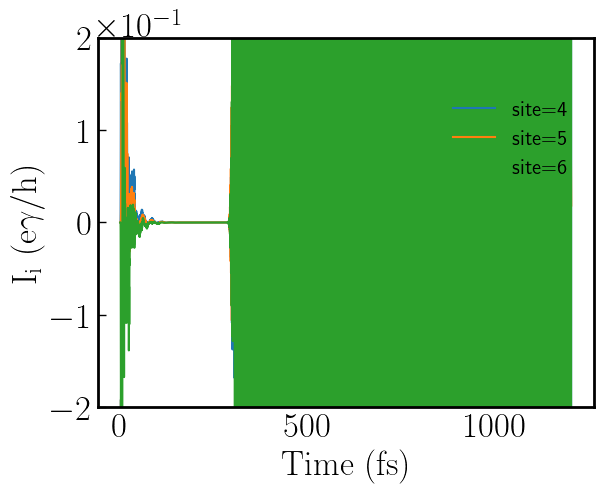

In [5]:
fig,axs =  plt.subplots(1,1)


for i in range(4,7,1):#range(4,7,1): ## Maximum is 9
    #axs.plot(cden_f[:,0], cden_f[:,i:i+1],label=f'site={i}') ### Charge bound current
    axs.plot(bcurr_f[:,0], bcurr_f[:,i:i +1],label=f'site={i}') ### Charge bound current


axs.set_ylabel(r"$\mathrm{I_i\ (e\gamma/h)}$", fontsize = fs)
axs.set_xlabel(r"$\mathrm{Time\ (fs)}$",fontsize = fs)
axs.tick_params(axis='both', which='both', labelsize=fs,direction='in', length=6,width=1)
axs.ticklabel_format(axis="y", style="sci", scilimits=(-1,2), useMathText=True)
axs.yaxis.offsetText.set_fontsize(fs)

plt.legend(frameon = False, fontsize = fs-10, loc= (0.7,  0.6))

#axs.set_ylim([-0.05,0.05])
plt.ylim([-20e-2,20e-2])
#plt.xlim([5000,5300])
#plt.xlim([0,200])

In [262]:
bcurr_f[:,10:11]

array([[-0.00018539],
       [-0.00025138],
       [-0.00056956],
       ...,
       [ 0.00018654],
       [ 0.0001958 ],
       [ 0.00020494]])

(0.0, 200.0)

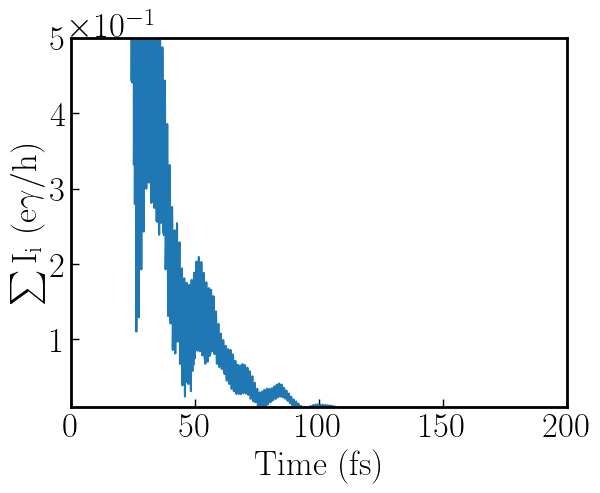

In [1002]:
fig,axs =  plt.subplots(1,1)


# for i in range(4,7,1): ## Maximum is 9
#     #axs.plot(cden_f[:,0], cden_f[:,i:i+1],label=f'site={i}') ### Charge bound current
#     axs.plot(bcurr_f[:,0], bcurr_f[:,i:i +1],label=f'site={i}') ### Charge bound current
i=0
btot = 0.
for i in range(1,10):
    #print(i)
    btot += np.abs(bcurr_f[:,i:i +1])

axs.plot(bcurr_f[:,0],btot ,label=f'site={i}')

axs.set_ylabel(r"$\mathrm{\sum I_i\ (e\gamma/h)}$", fontsize = fs)
axs.set_xlabel(r"$\mathrm{Time\ (fs)}$",fontsize = fs)
axs.tick_params(axis='both', which='both', labelsize=fs,direction='in', length=6,width=1)
axs.ticklabel_format(axis="y", style="sci", scilimits=(-1,2), useMathText=True)
axs.yaxis.offsetText.set_fontsize(fs)


#plt.legend(frameon = False, fontsize = fs-10, loc= (0.7,  0.6))

#axs.set_ylim([-0.05,0.05])
plt.ylim([0.1e-1,5e-1])
plt.xlim([0,200])

### Local bond spin currents

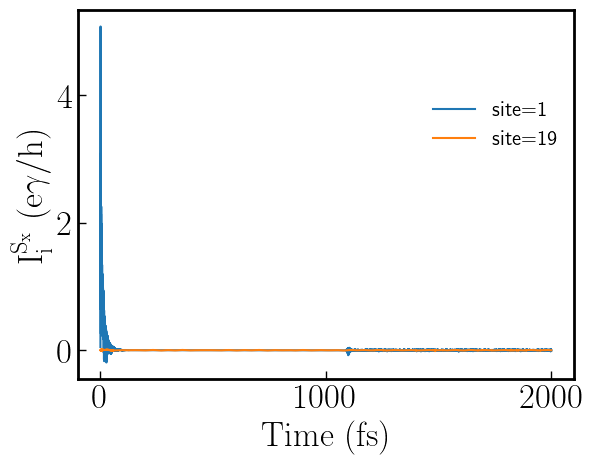

In [628]:
fig,axs =  plt.subplots(1,1)
### Charge bound current

# for i in range(4,7,1): ## Maximum is 9
#     #axs.plot(cden_f[:,0], cden_f[:,i:i+1],label=f'site={i}') ### Charge bound current
#     #axs.plot(bcurr_f[:,0], bcurr_f[:,i:i +1],label=f'site={i}') ### Charge bound current
#     axs.plot(bcurr_f[:,0], bcurr_f[:,9+i:9+i+1],label=f'site={i}',alpha =1-0.1*i) 
i=1
axs.plot(bcurr_f[:,0], bcurr_f[:,i:i+1],label=f'site={i}')

i=19
axs.plot(bcurr_f[:,0], bcurr_f[:,i:i+1],label=f'site={i}')

axs.set_ylabel(r"$\mathrm{I^{S_{x}}_i\ (e\gamma/h)}$", fontsize = fs)
axs.set_xlabel(r"$\mathrm{Time\ (fs)}$",fontsize = fs)
axs.tick_params(axis='both', which='both', labelsize=fs,direction='in', length=6,width=1)
axs.ticklabel_format(axis="y", style="sci", scilimits=(-1,2), useMathText=True)
axs.yaxis.offsetText.set_fontsize(fs)

plt.legend(frameon = False, fontsize = fs-10, loc= (0.7,  0.6))

#plt.xlim([7000,7300])

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19


(7000.0, 7400.0)

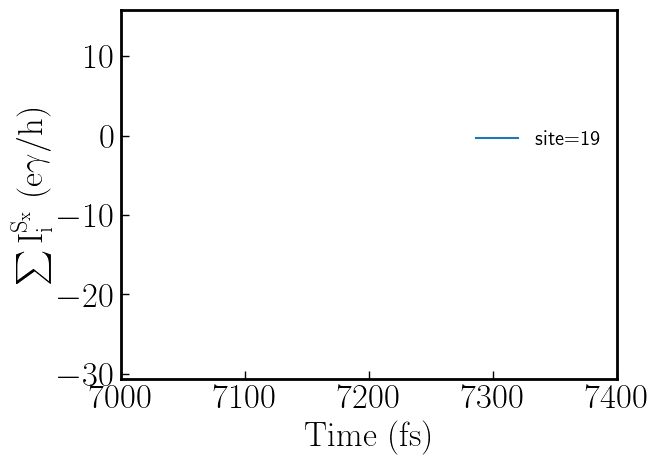

In [8]:
fig,axs =  plt.subplots(1,1)
### Charge bound current

# for i in range(4,7,1): ## Maximum is 9
#     #axs.plot(cden_f[:,0], cden_f[:,i:i+1],label=f'site={i}') ### Charge bound current
#     #axs.plot(bcurr_f[:,0], bcurr_f[:,i:i +1],label=f'site={i}') ### Charge bound current
#     axs.plot(bcurr_f[:,0], bcurr_f[:,9+i:9+i+1],label=f'site={i}',alpha =1-0.1*i) 


# For 20: 1-20:::20-39:::39-58:::58-77
# For 30: 1-30:::30-59:::59-88:::88-117
i=10
btot = 0.
for i in range(1,20):#range(10,10+9):#range(58,77):#range(10,20): 1-20:::20-39:::39-58:::58-77
    print(i)
    btot += bcurr_f[:,i:i +1]


axs.plot(bcurr_f[:,0], btot,label=f'site={i}')

axs.set_ylabel(r"$\mathrm{\sum I^{S_{x}}_i\ (e\gamma/h)}$", fontsize = fs)
axs.set_xlabel(r"$\mathrm{Time\ (fs)}$",fontsize = fs)
axs.tick_params(axis='both', which='both', labelsize=fs,direction='in', length=6,width=1)
axs.ticklabel_format(axis="y", style="sci", scilimits=(-1,2), useMathText=True)
axs.yaxis.offsetText.set_fontsize(fs)

plt.legend(frameon = False, fontsize = fs-10, loc= (0.7,  0.6))

plt.xlim([7000,7400])

(-1.0, 2.0)

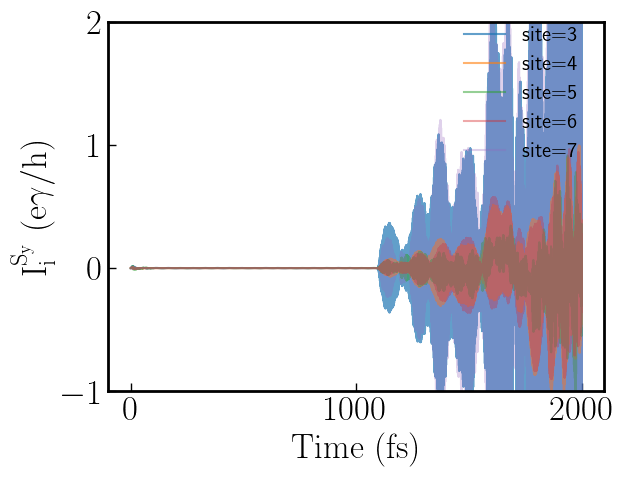

In [767]:
fig,axs =  plt.subplots(1,1)
for i in range(3,8,1): ## Maximum is 9
    #axs.plot(cden_f[:,0], cden_f[:,i:i+1],label=f'site={i}') ### Charge bound current
    #axs.plot(bcurr_f[:,0], bcurr_f[:,i:i +1],label=f'site={i}') ### Charge bound current
    axs.plot(bcurr_f[:,0], bcurr_f[:,18+i:18+i+1],label=f'site={i}',alpha =1-0.1*i) 
axs.set_ylabel(r"$\mathrm{I^{S_{y}}_i\ (e\gamma/h)}$", fontsize = fs)
axs.set_xlabel(r"$\mathrm{Time\ (fs)}$",fontsize = fs)
axs.tick_params(axis='both', which='both', labelsize=fs,direction='in', length=6,width=1)
axs.ticklabel_format(axis="y", style="sci", scilimits=(-1,2), useMathText=True)
axs.yaxis.offsetText.set_fontsize(fs)
plt.legend(frameon = False, fontsize = fs-10, loc= (0.7,  0.6))
#plt.xlim([5000,5300])
axs.set_ylim([-1,2])
#plt.xlim([0,1000])

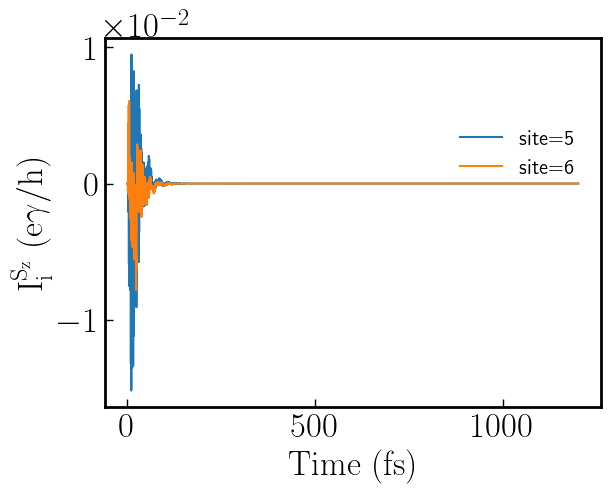

In [87]:
fig,axs =  plt.subplots(1,1)

#axs.plot(bcurr_f[:,0], bcurr_f[:,1+9*3:1+9*4]) ### Charge bound current
#axs.set_ylim([-0.05,0.05])
for i in range(5,7,1): ## Maximum is 9
    #axs.plot(cden_f[:,0], cden_f[:,i:i+1],label=f'site={i}') ### Charge bound current
    #axs.plot(bcurr_f[:,0], bcurr_f[:,i:i +1],label=f'site={i}') ### Charge bound current
    #axs.plot(bcurr_f[:,0], bcurr_f[:,18+i:18+i+1],label=f'site={i}',alpha =1-0.1*i) 
    axs.plot(bcurr_f[:,0], bcurr_f[:,i+9*3:i+1+9*3],label=f'site={i}')#,alpha =1-0.1*i) ### Charge bound current
axs.set_ylabel(r"$\mathrm{I^{S_{z}}_i\ (e\gamma/h)}$", fontsize = fs)
axs.set_xlabel(r"$\mathrm{Time\ (fs)}$",fontsize = fs)
axs.tick_params(axis='both', which='both', labelsize=fs,direction='in', length=6,width=1)
axs.ticklabel_format(axis="y", style="sci", scilimits=(-1,2), useMathText=True)
axs.yaxis.offsetText.set_fontsize(fs)
plt.legend(frameon = False, fontsize = fs-10, loc= (0.7,  0.6))
#plt.xlim([5000,5300])
#axs.set_ylim([-2e-2,2e-2])
#plt.xlim([0,1000])

### Local density

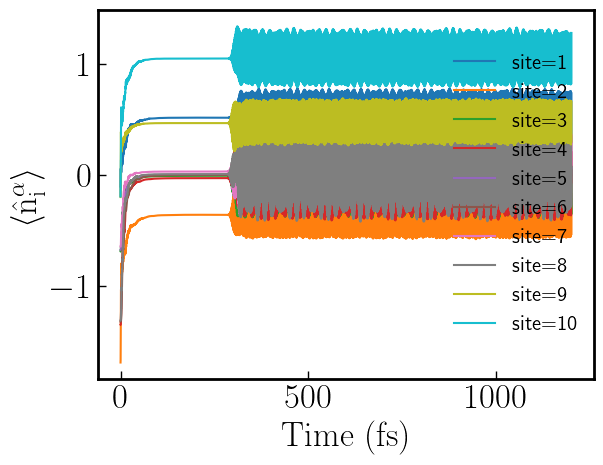

In [6]:

fig,axs =  plt.subplots(1,1)

for i in range(1,11):
    
    axs.plot(cden_f[:,0], cden_f[:,i:i+1],label=f'site={i}') ### Charge bound current

axs.set_ylabel(r"$\langle\mathrm{\hat{n}^{\alpha}_i}\rangle$", fontsize = fs)
axs.set_xlabel(r"$\mathrm{Time\ (fs)}$",fontsize = fs)
axs.tick_params(axis='both', which='both', labelsize=fs,direction='in', length=6,width=1)
axs.ticklabel_format(axis="y", style="sci", scilimits=(-1,2), useMathText=True)
axs.yaxis.offsetText.set_fontsize(fs)

plt.legend(frameon = False, fontsize = fs-10, loc= (0.7,  0.1))

#axs.set_ylim([-3e-1,1e-1])
#plt.xlim([5000,5300])
#plt.xlim([0,2000])
#cden_f.shape

In [925]:
cden_f[:,1:1+1]

array([[-0.19185364],
       [-0.13031587],
       [-0.05180847],
       ...,
       [ 0.51610793],
       [ 0.51610793],
       [ 0.51610793]])

# Spin currents

## spin currents in the leads 

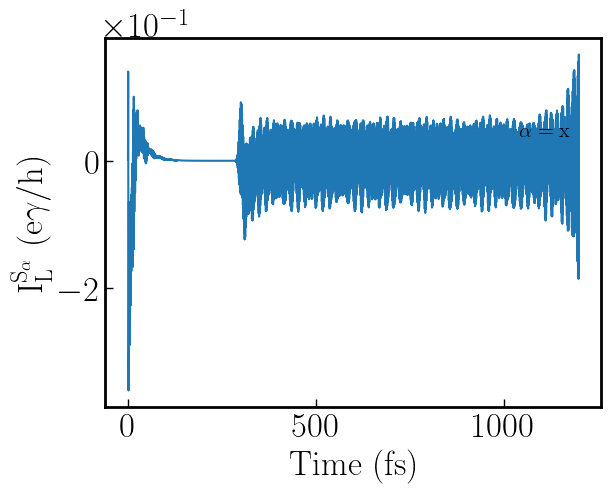

In [9]:
fig,axs = plt.subplots(1,1)
axs.plot(sc_f[:,0],sc_f[:,1], label = r'$\mathrm{\alpha = x}$')
#axs.plot(sc_f[:,0],sc_f[:,2], label = r'$\mathrm{\alpha = y}$')
#axs.plot(sc_f[:,0],sc_f[:,3], label = r'$\mathrm{\alpha = z}$')

axs.set_ylabel(r"$\mathrm{I^{S_{\alpha}}_L\ (e\gamma/h)}$", fontsize = fs)
axs.set_xlabel(r"$\mathrm{Time\ (fs)}$",fontsize = fs)
#plt.ylim([-1.5,1.5])
axs.tick_params(axis='both', which='both', labelsize=fs,direction='in', length=6,width=1)
axs.ticklabel_format(axis="y", style="sci", scilimits=(-1,2), useMathText=True)
axs.yaxis.offsetText.set_fontsize(fs)
#plt.xlim([250,350])
plt.legend(frameon = False, fontsize = fs-10, loc= (0.7,  0.7))
#plt.xlim([1700,1800])


## Total spin current  ($I^{S_{\alpha}}_{Total} =I ^{S_{\alpha}}_{L} -I ^{S_{\alpha}}_{R} )$

(0.0, 1200.0)

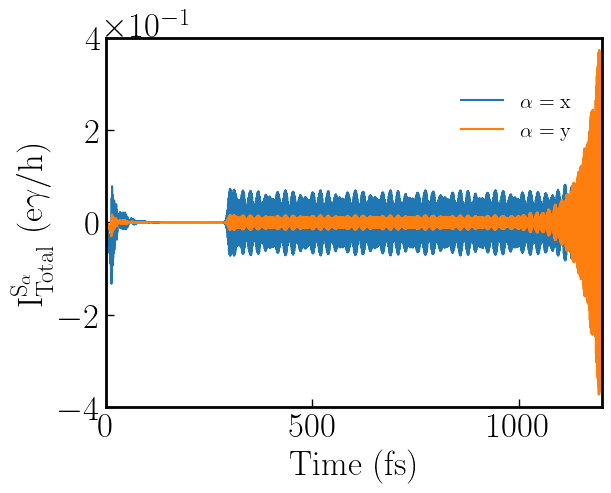

In [15]:
fig,axs = plt.subplots(1,1)
axs.plot(sc_f[:,0],(sc_f[:,1] - sc_f[:,4])/2, label = r'$\mathrm{\alpha = x}$')
axs.plot(sc_f[:,0],(sc_f[:,2]-sc_f[:,5])/2, label = r'$\mathrm{\alpha = y}$')
#axs.plot(sc_f[:,0],(sc_f[:,3]- sc_f[:,6])/2, label = r'$\mathrm{\alpha = z}$')

axs.set_ylabel(r"$\mathrm{I^{S_{\alpha}}_{Total}\ (e\gamma/h)}$", fontsize = fs)
axs.set_xlabel(r"$\mathrm{Time\ (fs)}$",fontsize = fs)
plt.ylim([-4e-1,4e-1])
axs.tick_params(axis='both', which='both', labelsize=fs,direction='in', length=6,width=1)
axs.ticklabel_format(axis="y", style="sci", scilimits=(-1,2), useMathText=True)
axs.yaxis.offsetText.set_fontsize(fs)
#plt.xlim([200,500])
plt.legend(frameon = False, fontsize = fs-10, loc= (0.7,  0.7))
plt.xlim([0,1200])

## Classical spin densities

In [100]:
cspins_f = np.loadtxt(f"{path}/test_jl.txt" )
#cspins_f = np.loadtxt(f"{path}/test_avrg_jl.txt")#test_jl.txt" )
from scipy import signal


In [393]:
np.shape(cspins_f)
# cspins_f[0]
# tt=np.arange(0.5, step=0.5, stop=3000)
# tt
# cspins_f
np.shape(cspins_f)
cspins_f[1,:,:]

(3600000,)

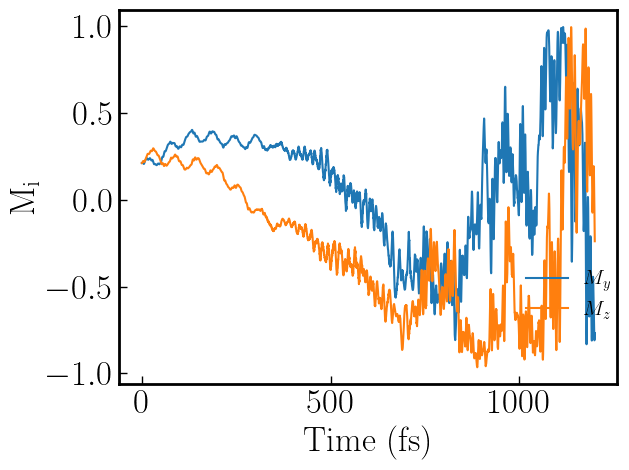

In [20]:
#N_sites = (cspins_f.shape[1]-1)//3        ### Number of sites 
fig,axs = plt.subplots(1,1)



#plt.plot(data[f"cspins_f_{name1}"][:,0],data[f"cspins_f_{name1}"][:,13])
site = 8
#axs.plot(cspins_f[1][site*3+1],label=r'$M_x$')
#axs.plot(cspins_f[:,0],cspins_f[:,site*3+1],label=r'$M_x$')
axs.plot(cspins_f[:,0],cspins_f[:,site*3+2],label=r'$M_y$')
axs.plot(cspins_f[:,0],cspins_f[:,site*3+3],label=r'$M_z$')
# axs.plot(cspins_f[:,0],cspins_f[:,site*3+6],label=r'$M_z$')
# axs.plot(cspins_f[:,0],cspins_f[:,site*3+9],label=r'$M_z$')
#site = 1
####axs.plot(cspins_f[:,0],cspins_f[:,site*3+1],label=r'$M_x$')
#axs.plot(cspins_f[:,0],cspins_f[:,site*3+2],label=r'$M_y$')
###axs.plot(cspins_f[:,0],cspins_f[:,site*3+3],label=r'$M_z$')

# axs.plot(cspins_f[:,0],cspins_f[:,4],alpha = 0.5)
# axs.plot(cspins_f[:,0],cspins_f[:,5])
# axs.plot(cspins_f[:,0],cspins_f[:,6],alpha = 0.5)

axs.set_ylabel(r"$\mathrm{M_i}$", fontsize = fs)
axs.set_xlabel(r"$\mathrm{Time\ (fs)}$",fontsize = fs)
axs.tick_params(axis='both', which='both', labelsize=fs,direction='in', length=6,width=1)
axs.ticklabel_format(axis="y", style="sci", scilimits=(-1,2), useMathText=True)
axs.yaxis.offsetText.set_fontsize(fs)
plt.legend(frameon = False, fontsize = fs-10, loc= (0.8,  0.15))
#plt.axvline(3560/4)
#axs.set_xlim([1000,2200])
#axs.set_xlim([1100,2000])
#plt.xlim([480,500])
plt.tight_layout()
#plt.savefig("Mag.png")
#plt.plot(cspins_f[:,1]**2 + cspins_f[:,2]**2 + cspins_f[:,3]**2 )


## window = signal.windows.hamming(1999)

np.shape(F1[1::1])

(1.0, 30.0)

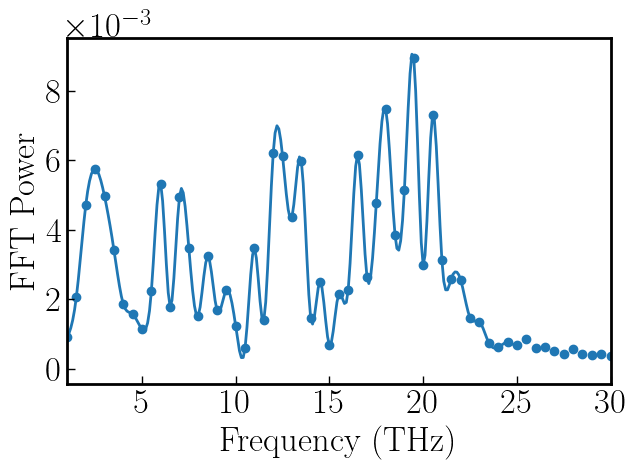

In [421]:
from scipy.interpolate import interp1d
fig,axes=plt.subplots(1,1)
site=5
t0= 0#50000#0#5000#010000#10000#1000#10000#400#10000
tf= 100000
dt=0.5#1.0#0.1
W1,F1 = fourier_transform(cspins_f[t0:tf,0],cspins_f[t0:tf,site*3+1],dt)#cspins_f[t0:tf,site*3+3], 0.1)
#W1,F1 = fourier_transform(cspins_f[t0:tf,0],cspins_f[t0:tf,site*3+3], 0.1)
W1 = W1[::1]*1000#**2#omega#/(2*np.pi)#*T1 
F1[1::1] = np.multiply(F1[1::1],window)
f = interp1d(W1[1::1],F1[1::1], kind='cubic')#,fill_value="extrapolate")
x = np.arange(0.5,25,0.1)
axes.scatter(W1[1::1],F1[1::1],ls ='-')#,markeredgecolor ='black' ,lw=2,mfc='white',ms=5,label = r'$\mathrm{N_{lattice}=10}$')
axes.plot(x,f(x),ls ='-',markeredgecolor ='black' ,lw=2,mfc='white',ms=5,label = r'$\mathrm{N_{lattice}=10}$')
#axes.plot(W1,F1,ls ='-',markeredgecolor ='black' ,lw=2,mfc='white',ms=5,label = r'$\mathrm{N_{lattice}=10}$')

axes.set_xlabel(r'$\mathrm{Frequency\ (THz)}$',fontsize=fs)
axes.set_ylabel(r'$\mathrm{FFT \ Power}$',fontsize=fs)

#axs.text(x=0.95, y=0.94, s=index[i],fontsize=fs,ha='center', transform=axs.transAxes)
#axs.text(x=0.95, y=0.93, s=index[i],fontsize=fs,ha='center', transform=ax.transAxes)
axes.yaxis.set_major_locator(plt.MaxNLocator(5,integer=True))
axes.xaxis.set_major_locator(plt.MaxNLocator(6,integer=True))
axes.tick_params(axis='both', which='both', labelsize=fs,direction='in', length=6,width=1)
axes.ticklabel_format(axis="y", style="sci", scilimits=(-1,2), useMathText=True)
axes.yaxis.offsetText.set_fontsize(fs)
plt.tight_layout()
axes.set_xlim(1,30)

(0.0, 25.0)

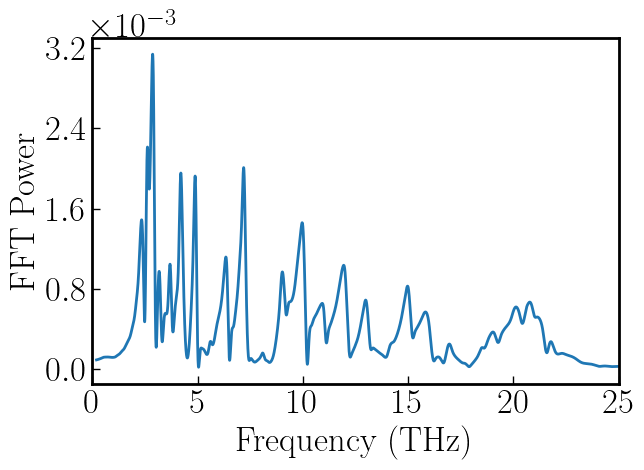

In [345]:
from scipy.interpolate import interp1d
fig,axes=plt.subplots(1,1)
site=9
t0= 0#5000#0#5000#010000#10000#1000#10000#400#10000
tf= 10000
dt=1.0#0.1
W1,F1 = fourier_transform(cspins_f[t0:tf,0],cspins_f[t0:tf,site*3+2],dt)#cspins_f[t0:tf,site*3+3], 0.1)
#W1,F1 = fourier_transform(cspins_f[t0:tf,0],cspins_f[t0:tf,site*3+3], 0.1)
W1 = W1[::1]*1000#**2#omega#/(2*np.pi)#*T1 
f = interp1d(W1[1::1],F1[1::1], kind='cubic')#,fill_value="extrapolate")
x = np.arange(0.2,100,0.001)
#axes.scatter(W1[1::1],F1[1::1],ls ='-')#,markeredgecolor ='black' ,lw=2,mfc='white',ms=5,label = r'$\mathrm{N_{lattice}=10}$')
axes.plot(x,f(x),ls ='-',markeredgecolor ='black' ,lw=2,mfc='white',ms=5,label = r'$\mathrm{N_{lattice}=10}$')
#axes.plot(W1,F1,ls ='-',markeredgecolor ='black' ,lw=2,mfc='white',ms=5,label = r'$\mathrm{N_{lattice}=10}$')

axes.set_xlabel(r'$\mathrm{Frequency\ (THz)}$',fontsize=fs)
axes.set_ylabel(r'$\mathrm{FFT \ Power}$',fontsize=fs)

#axs.text(x=0.95, y=0.94, s=index[i],fontsize=fs,ha='center', transform=axs.transAxes)
#axs.text(x=0.95, y=0.93, s=index[i],fontsize=fs,ha='center', transform=ax.transAxes)
axes.yaxis.set_major_locator(plt.MaxNLocator(5,integer=True))
axes.xaxis.set_major_locator(plt.MaxNLocator(6,integer=True))
axes.tick_params(axis='both', which='both', labelsize=fs,direction='in', length=6,width=1)
axes.ticklabel_format(axis="y", style="sci", scilimits=(-1,2), useMathText=True)
axes.yaxis.offsetText.set_fontsize(fs)
plt.tight_layout()
axes.set_xlim(0,25)
#axes.set_yscale('log')

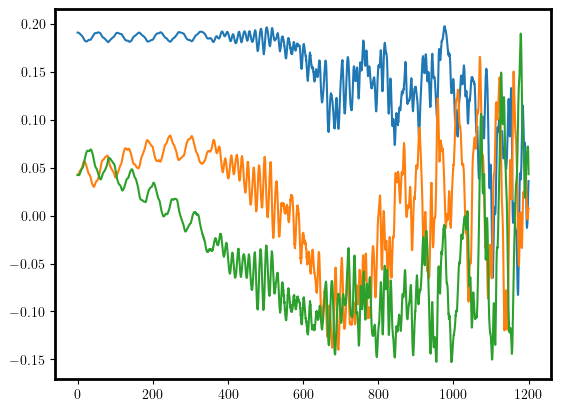

In [121]:
### Average value of the magnetic moment 
fig,axs = plt.subplots(1,1)
#plt.plot(data[f"cspins_f_{name1}"][:,0],data[f"cspins_f_{name1}"][:,13])
site = 1
L= (np.shape(cspins_f)[1]-1)//3
avgx_t = 0.0
avgy_t = 0.0
avgz_t = 0.0
for site in [0,L-1]:
    avgx_t +=cspins_f[:,site*3+1]
    avgy_t +=cspins_f[:,site*3+2]
    avgz_t +=cspins_f[:,site*3+3]

avgx_t= avgx_t/L
avgy_t= avgy_t/L
avgz_t= avgz_t/L
    


#average_y = (cspins_f[:,0*3+2]+cspins_f[:,1*3+2]+cspins_f[:,2*3+2]+cspins_f[:,3*3+2]+cspins_f[:,4*3+2]+cspins_f[:,5*3+2])/6#[(cspins_f[:,site*3+2])/6 for site in range(1:6)]
# for i in range(1,6):
#average_z = (cspins_f[:,0*3+3]+cspins_f[:,1*3+3]+cspins_f[:,2*3+3]+cspins_f[:,3*3+3]+cspins_f[:,4*3+3]+cspins_f[:,5*3+3])/6#[(cspins_f[:,site*3+2])/6 for site in range(1:6)]

#     average_y += cspins_f[:,site*3+2]/6
axs.plot(cspins_f[:,0],avgx_t,label=r'$M_x$')
axs.plot(cspins_f[:,0],avgy_t,label=r'$M_y$')
axs.plot(cspins_f[:,0],avgz_t,label=r'$M_z$')

#axs.set_xlim(200,500)
# cspins_f[:,site*3+2].shape

In [12]:
#average_y
hbar = 0.658211928e0 # (eV*fs)
(2*0.01/hbar)*(2*np.pi/30)**2*1000/(2*np.pi)

1/((2*1/hbar)*(2*np.pi/30)**2/(2*np.pi))

47.14095687446102

In [33]:
np.shape(cspins_f)

#1.5*4

(10000, 91)

23.8


(0.0, 15.0)

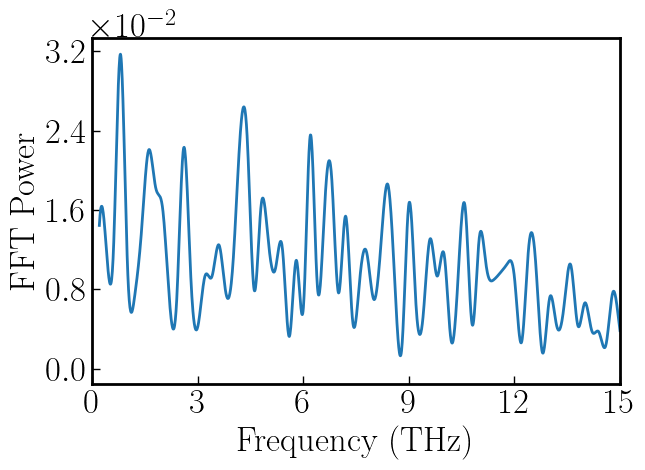

In [62]:
from scipy.interpolate import interp1d
fig,axes=plt.subplots(1,1)
site=0
t0= 5000#0#5000#010000#10000#1000#10000#400#10000
tf= 10000
dt=1
W1,F1 = fourier_transform(cspins_f[t0:tf,0],avgy_t[t0:tf],dt)#cspins_f[t0:tf,site*3+3], 0.1)
#W1,F1 = fourier_transform(cspins_f[t0:tf,0],cspins_f[t0:tf,site*3+3], 0.1)
W1 = W1[::1]*1000#**2#omega#/(2*np.pi)#*T1 
f = interp1d(W1[1::1],F1[1::1], kind='cubic')#,fill_value="extrapolate")
x = np.arange(0.2,40,0.01)
#axes.scatter(W1[1::1],F1[1::1],ls ='-')#,markeredgecolor ='black' ,lw=2,mfc='white',ms=5,label = r'$\mathrm{N_{lattice}=10}$')
axes.plot(x,f(x),ls ='-',markeredgecolor ='black' ,lw=2,mfc='white',ms=5,label = r'$\mathrm{N_{lattice}=10}$')
#axes.plot(W1,F1,ls ='-',markeredgecolor ='black' ,lw=2,mfc='white',ms=5,label = r'$\mathrm{N_{lattice}=10}$')

axes.set_xlabel(r'$\mathrm{Frequency\ (THz)}$',fontsize=fs)
axes.set_ylabel(r'$\mathrm{FFT \ Power}$',fontsize=fs)

#axs.text(x=0.95, y=0.94, s=index[i],fontsize=fs,ha='center', transform=axs.transAxes)
#axs.text(x=0.95, y=0.93, s=index[i],fontsize=fs,ha='center', transform=ax.transAxes)
axes.yaxis.set_major_locator(plt.MaxNLocator(5,integer=True))
axes.xaxis.set_major_locator(plt.MaxNLocator(6,integer=True))
axes.tick_params(axis='both', which='both', labelsize=fs,direction='in', length=6,width=1)
axes.ticklabel_format(axis="y", style="sci", scilimits=(-1,2), useMathText=True)
axes.yaxis.offsetText.set_fontsize(fs)
ll=14
print(0.3*ll+0.1*ll**2)
#axes.axvline(0.9,color='red') #46
#axes.axvline(0.21,color='red') 
#axes.axvline(1.92,color='red') 
# axes.axvline(1.92*3,color='red') 
# axes.axvline(1.92*8,color='red') 
#axes.axvline(1.5*11.4,color='red') 
#axes.axvline(19,color='red') 
# axes.axvline(1.5,color='red') #36
# axes.axvline(2.8,color='blue') #26
# axes.axvline(3.4,color='red') #24
# axes.axvline(4.0,color='red') #22
#axes.axvline(0.5,color='blue') #20 with Jex = 0.01 #### from here is hard to observe something
#axes.axvline(2.4,color='blue') #20 with Jex = 0.05
#axes.axvline(2.4*2,color='blue') #20 with Jex = 0.05
#axes.axvline(2.4*3,color='blue') #20 with Jex = 0.05
#axes.axvline(4.7,color='blue') #20
# axes.axvline(6,color='red') #18
# axes.axvline(7.5,color='red') #16
# axes.axvline(9.5,color='red') #14
# axes.axvline(13,color='red') #12 sites
#axes.axvline(18.5,color='red') #10 sites
#axes.axvline(1.9,color='red') #10 sites Jsd=0.01
#axes.axvline(17.5+6,color='red')
#axes.axvline(17.5-5,color='black')
# axes.axvline(17.5-5*2,color='black')
# axes.axvline(17.5-5*3,color='black')
plt.tight_layout()
axes.set_xlim(0,15)
#axes.set_ylim(0,1e-4)
#axes.set_xlim(0,100)
#plt.savefig("Mag_FFT_curr.png")
#axes.set_yscale('log')

In [242]:
band_f = np.loadtxt(f"{path}/test_band_jl.txt" )
band_ferro_f = np.loadtxt(f"{path}/test_ferro_band_jl.txt" )
band_aferro_f = np.loadtxt(f"{path}/test_aferro_band_jl.txt" )

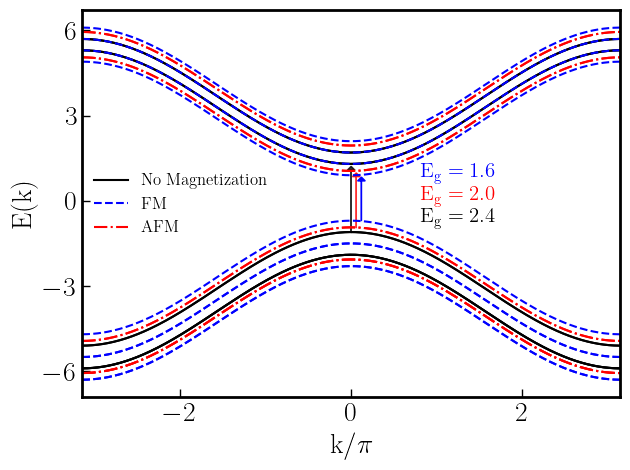

In [364]:
fig,axes = plt.subplots(1,1)
plt.plot(band_f[:,0],band_f[:,1::],color='black')
plt.plot(band_f[:,0],band_f[:,1],color='black',label=r'$\mathrm{No\ Magnetization}$')

plt.plot(band_ferro_f[:,0],band_ferro_f[:,1],color='blue',ls='--',label=r'$\mathrm{FM}$')
plt.plot(band_ferro_f[:,0],band_ferro_f[:,1::],color='blue',ls='--')

plt.plot(band_ferro_f[:,0],band_aferro_f[:,1::],color='red',ls='-.')
plt.plot(band_ferro_f[:,0],band_aferro_f[:,1],color='red',ls='-.',label=r'$\mathrm{AFM}$')



axes.set_xlabel(r'$\mathrm{k/\pi}$',fontsize=fs)
axes.set_ylabel(r'$\mathrm{E(k)}$',fontsize=fs)

axes.yaxis.set_major_locator(plt.MaxNLocator(5,integer=True))
axes.tick_params(axis='both', which='both', labelsize=fs,direction='in', length=6,width=1)
axes.ticklabel_format(axis="y", style="sci", scilimits=(-1,2), useMathText=True)
axes.yaxis.offsetText.set_fontsize(fs)

axes.set_xlim(-3.14,3.14)

plt.legend(frameon = False, fontsize = fs-8, loc= (0.01,  0.4))
plt.text(0.8,-0.8,r'$\rm{E_g=2.4}$' ,fontsize=fs-5,color='black')
plt.text(0.8,-0.0,r'$\rm{E_g=2.0}$' ,fontsize=fs-5,color='red')
plt.text(0.8,0.8,r'$\rm{E_g=1.6}$' ,fontsize=fs-5,color='blue')

plt.tight_layout()
#plt.arrow(x=0.,ymin=-1.12,ymax=-1.12+2.4,color='black',alpha=0.8,ls='-')
plt.arrow(x=0.,y=-1.12,dy=2.2,dx=0,color='black',alpha=0.8,head_width=0.09)### 2.4
plt.arrow(x=0.06,y=-0.95,dy=1.8,dx=0,color='red',alpha=0.8,head_width=0.09)### 2.0
plt.arrow(x=0.06*2,y=-0.7,dy=1.4,dx=0,color='blue',alpha=1.0,head_width=0.09)### 1.6
# plt.vlines(x=0.06,ymin=-0.95,ymax=-0.96+2.0,color='red',alpha=0.8,ls='-')
# plt.vlines(x=0.06*2,ymin=-0.7,ymax=-0.7+1.6,color='blue',alpha=0.8,ls='-')

plt.savefig('band_structure.png')

In [317]:
plt.arrow?

Signature: plt.arrow(x, y, dx, dy, **kwargs)
Docstring:
Add an arrow to the Axes.

This draws an arrow from ``(x, y)`` to ``(x+dx, y+dy)``.

Parameters
----------
x, y : float
    The x and y coordinates of the arrow base.

dx, dy : float
    The length of the arrow along x and y direction.

width : float, default: 0.001
    Width of full arrow tail.

length_includes_head : bool, default: False
    True if head is to be counted in calculating the length.

head_width : float or None, default: 3*width
    Total width of the full arrow head.

head_length : float or None, default: 1.5*head_width
    Length of arrow head.

shape : {'full', 'left', 'right'}, default: 'full'
    Draw the left-half, right-half, or full arrow.

overhang : float, default: 0
    Fraction that the arrow is swept back (0 overhang means
    triangular shape). Can be negative or greater than one.

head_starts_at_zero : bool, default: False
    If True, the head starts being drawn at coordinate 0
    instead of ending

## Equilibirium spin densities

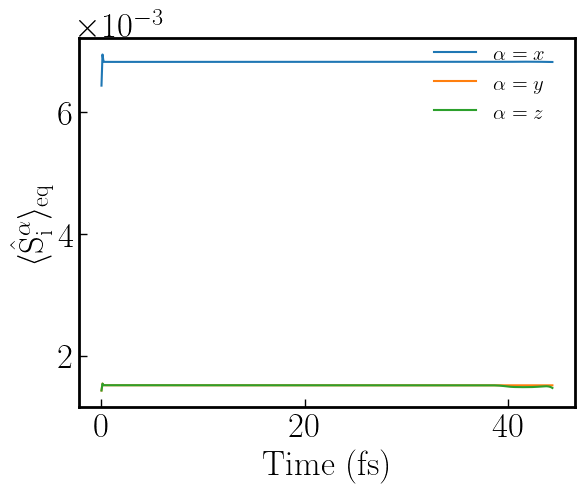

In [138]:
fig,axs = plt.subplots(1,1)
site = 3
#plt.plot(data[f"cspins_f_{name1}"][:,0],data[f"cspins_f_{name1}"][:,13])
axs.plot(seq_f[:,0],seq_f[:,site*3+1],label = r'$\alpha=x$')
axs.plot(seq_f[:,0],seq_f[:,site*3+2],label = r'$\alpha=y$')
axs.plot(seq_f[:,0],seq_f[:,site*3+3],label = r'$\alpha=z$')

axs.set_ylabel(r"$\langle\mathrm{\hat{S}^{\alpha}_i}\rangle_{\mathrm{eq}}$", fontsize = fs)
axs.set_xlabel(r"$\mathrm{Time\ (fs)}$",fontsize = fs)
axs.tick_params(axis='both', which='both', labelsize=fs,direction='in', length=6,width=1)
axs.ticklabel_format(axis="y", style="sci", scilimits=(-1,2), useMathText=True)
axs.yaxis.offsetText.set_fontsize(fs)
plt.legend(frameon = False, fontsize = fs-10, loc= (0.7,  0.75))

#axs.set_xlim([5000,5100])


## Nonequilibrium spin densities

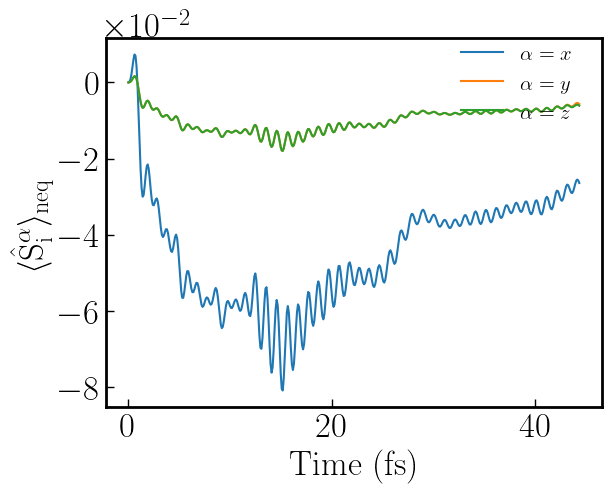

In [139]:
fig,axs = plt.subplots(1,1)
#plt.plot(data[f"cspins_f_{name1}"][:,0],data[f"cspins_f_{name1}"][:,13])
site = 0

axs.plot(sneq_f[:,0],sneq_f[:,site*3+1],label = r'$\alpha=x$')
axs.plot(sneq_f[:,0],sneq_f[:,site*3+2],label = r'$\alpha=y$')
axs.plot(sneq_f[:,0],sneq_f[:,site*3+3],label = r'$\alpha=z$')

axs.set_ylabel(r"$\langle\mathrm{\hat{S}^{\alpha}_i}\rangle_{\mathrm{neq}}$", fontsize = fs)
axs.set_xlabel(r"$\mathrm{Time\ (fs)}$",fontsize = fs)
axs.tick_params(axis='both', which='both', labelsize=fs,direction='in', length=6,width=1)
axs.ticklabel_format(axis="y", style="sci", scilimits=(-1,2), useMathText=True)
axs.yaxis.offsetText.set_fontsize(fs)
plt.legend(frameon = False, fontsize = fs-10, loc= (0.7,  0.75))

#axs.set_xlim([5000,5100])


## Non equilibirium spin densities per site 

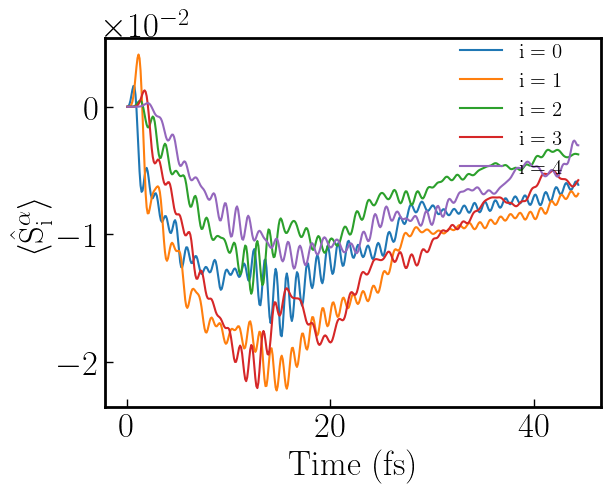

In [140]:
fig,axs = plt.subplots(1,1)
al = 3 
axs.plot(sneq_f[:,0],sneq_f[:,0*3+al],label = r'$\mathrm{i=0}$')
axs.plot(sneq_f[:,0],sneq_f[:,1*3+al],label = r'$\mathrm{i=1}$')
axs.plot(sneq_f[:,0],sneq_f[:,2*3+al],label = r'$\mathrm{i=2}$')
axs.plot(sneq_f[:,0],sneq_f[:,3*3+al],label = r'$\mathrm{i=3}$')
axs.plot(sneq_f[:,0],sneq_f[:,4*3+al],label = r'$\mathrm{i=4}$')

axs.set_ylabel(r"$\langle\mathrm{\hat{S}^{\alpha}_i}\rangle$", fontsize = fs)
axs.set_xlabel(r"$\mathrm{Time\ (fs)}$",fontsize = fs)
axs.tick_params(axis='both', which='both', labelsize=fs,direction='in', length=6,width=1)
axs.ticklabel_format(axis="y", style="sci", scilimits=(-1,2), useMathText=True)
axs.yaxis.offsetText.set_fontsize(fs)
plt.legend(frameon = False, fontsize = fs-10, loc= (0.7,  0.6))
#axs.set_ylim([-1e-1,1e-1])
#axs.set_xlim([0,100])

/tmp/ipykernel_13437/2037619220.py:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(figsize=(10,10))


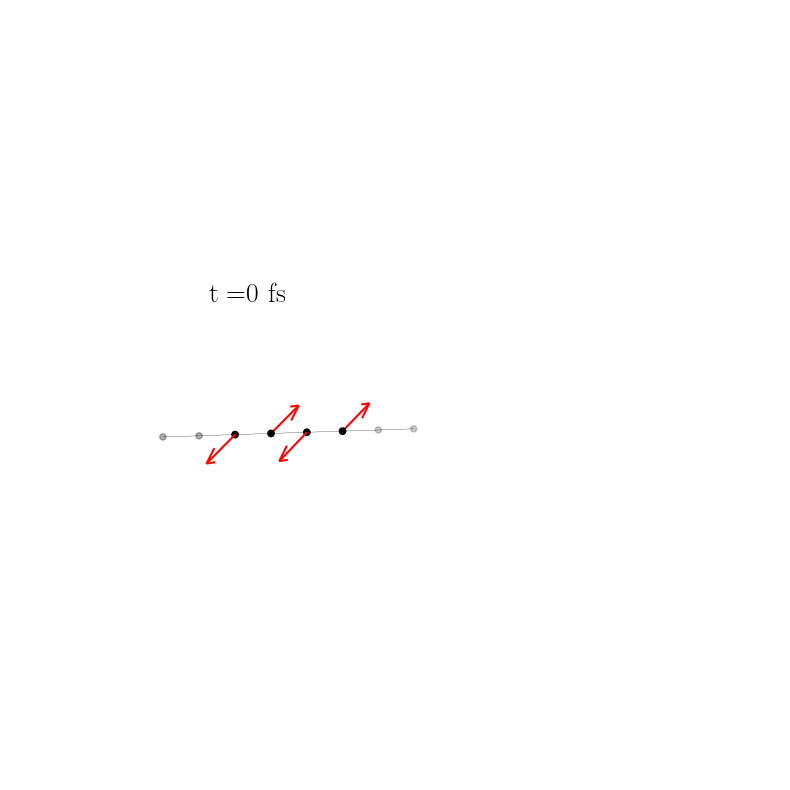

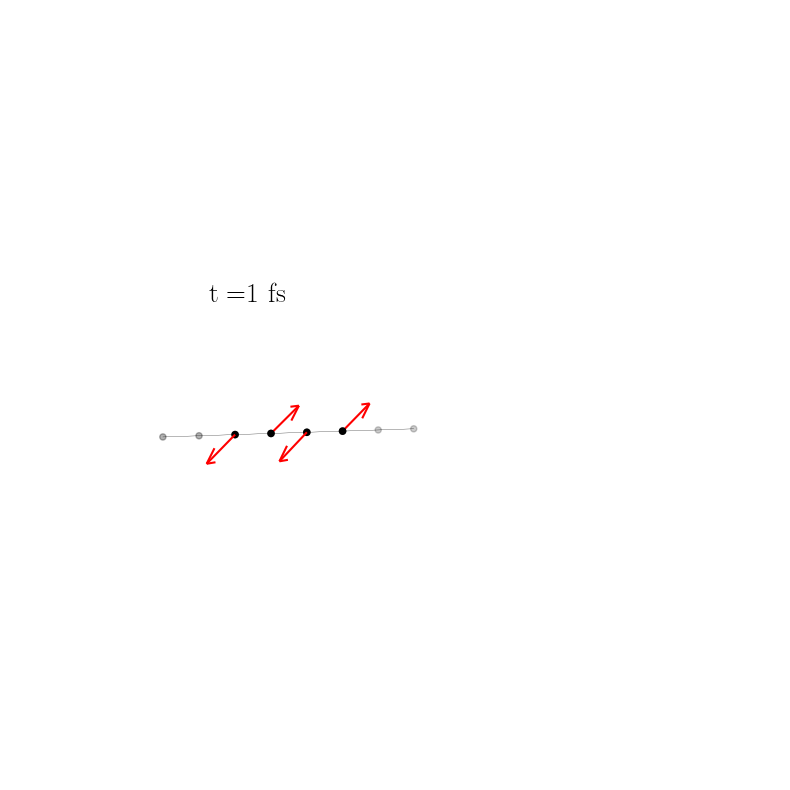

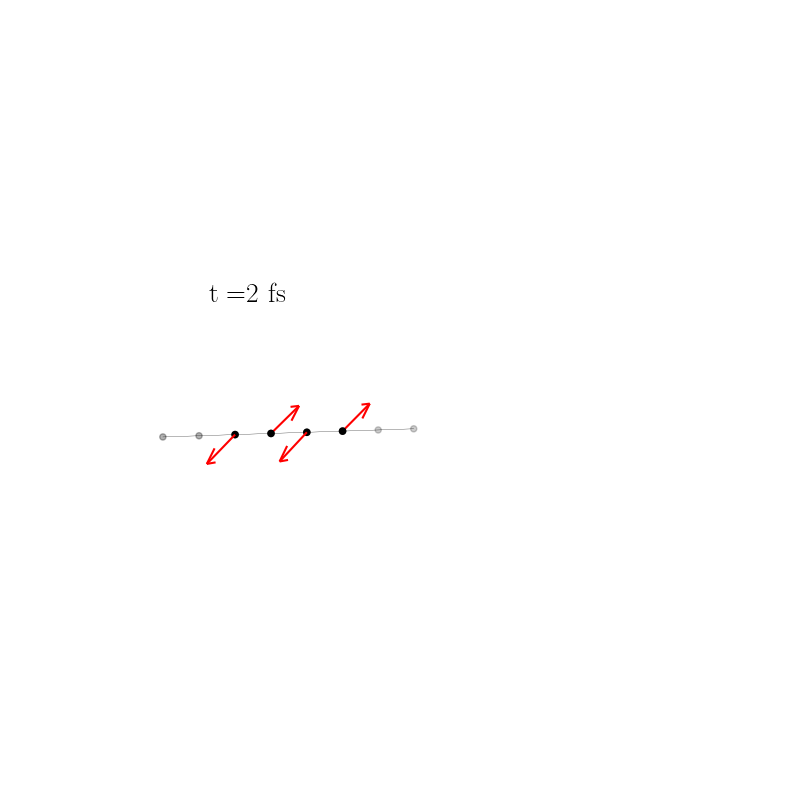

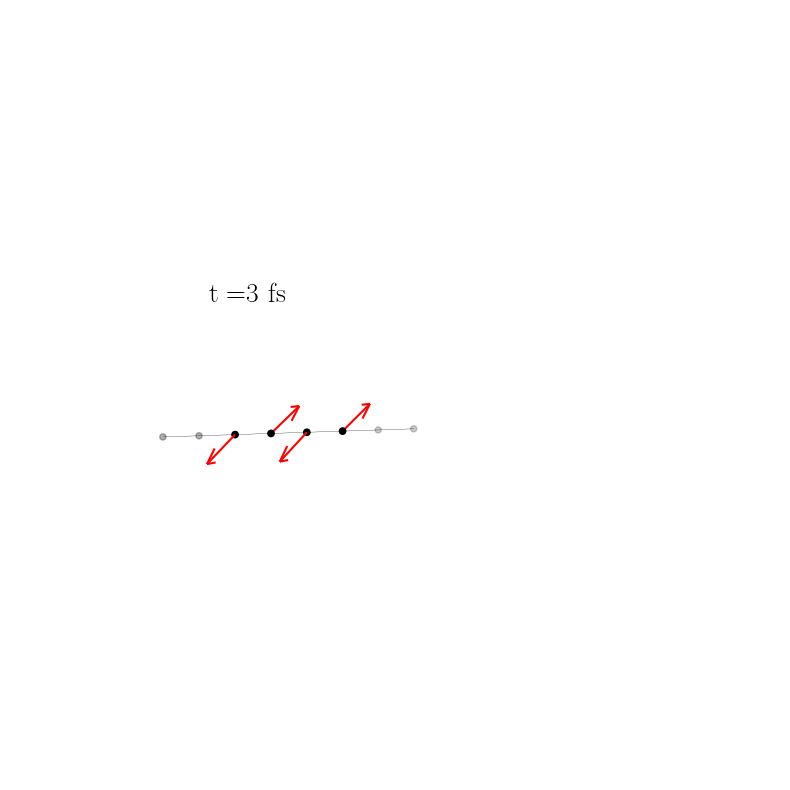

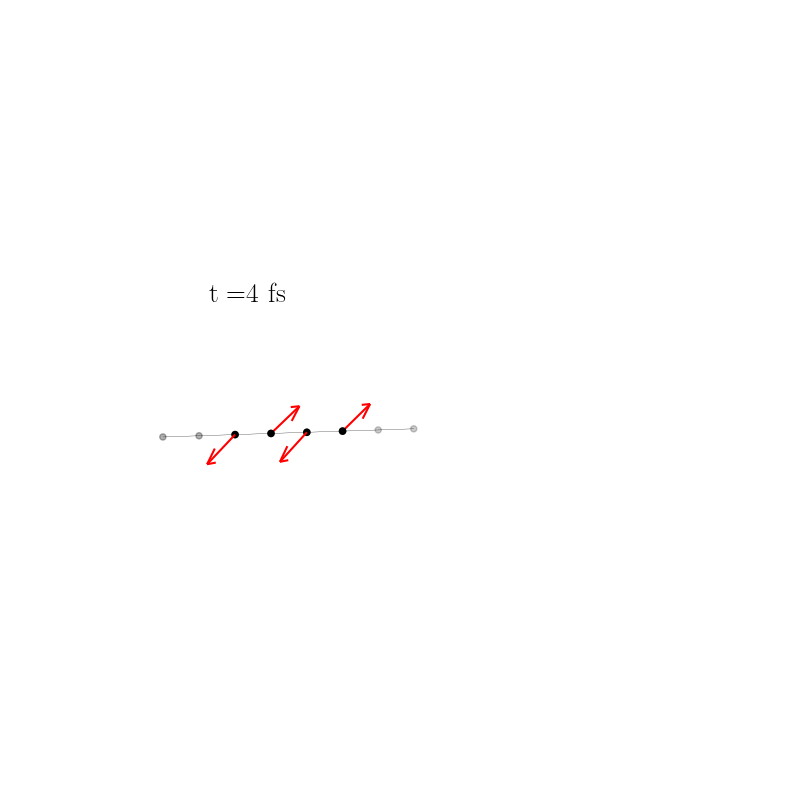

...

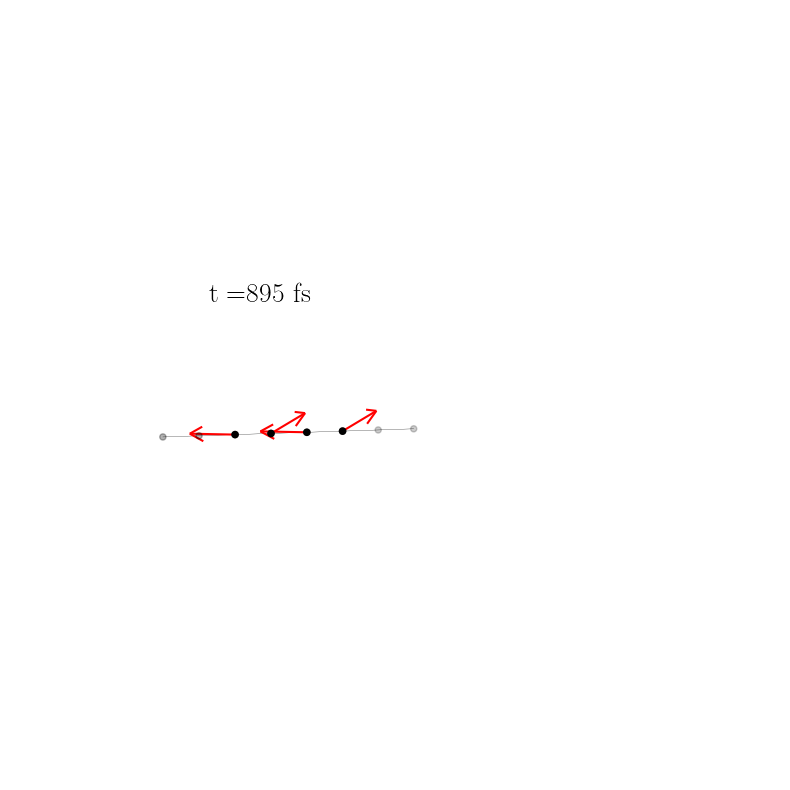

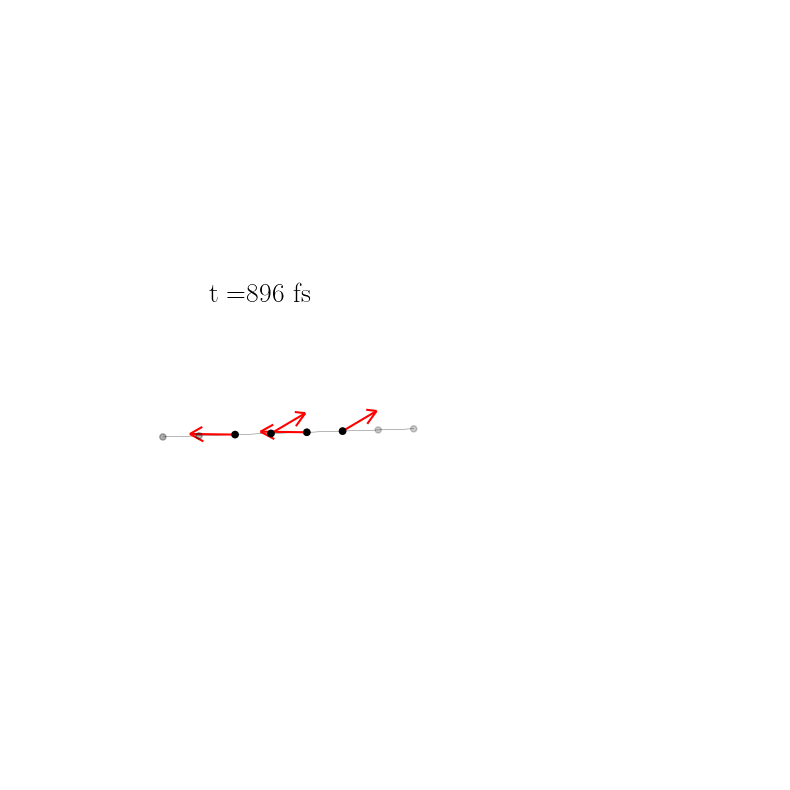

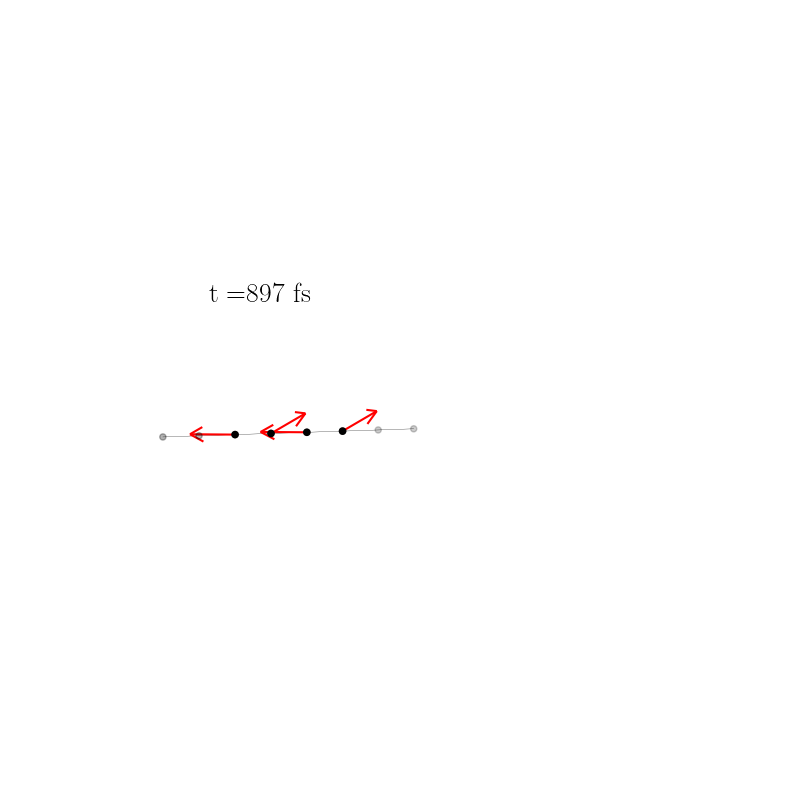

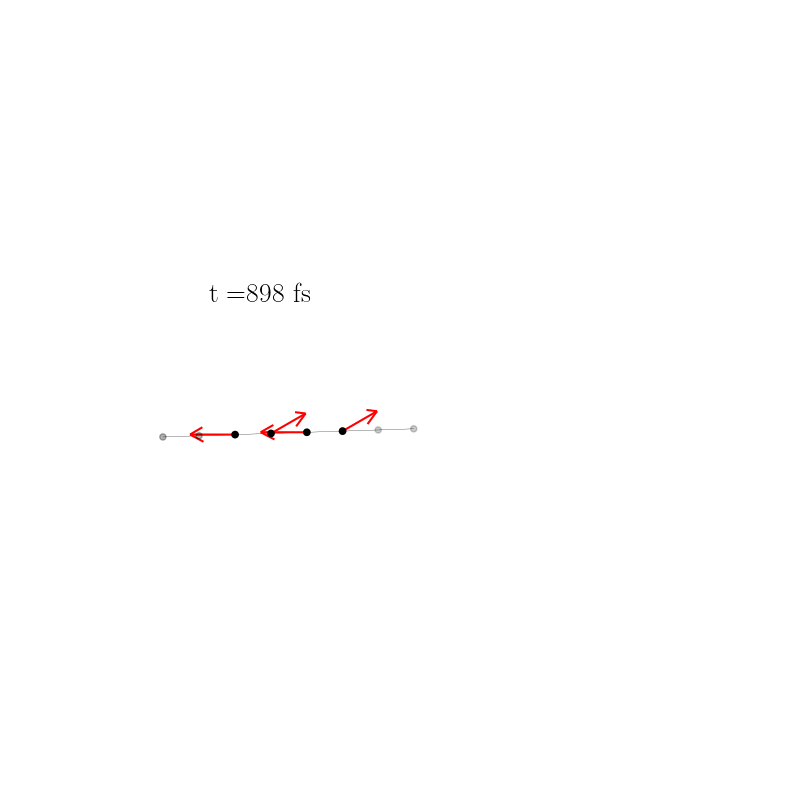

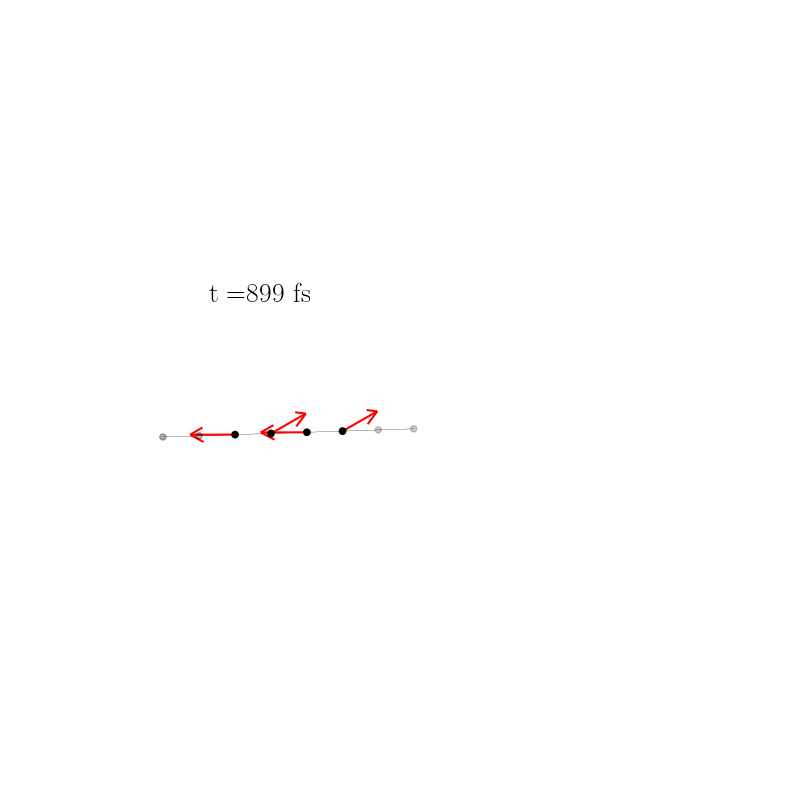

In [46]:
fs=20
for t in range(0,900):

    from mpl_toolkits.mplot3d import Axes3D
    fig = plt.figure(figsize=(10,10))
    ax = fig.add_subplot(111, projection='3d')

    #soa = np.array([[0, 0, 0, 1, 2, 1], [1, 0, 0, 2, 2, 2], [2, 0, 0, 2, 2, 3] ])

    site = 1
# axs.plot(cspins_f[:,0],cspins_f[:,site*3+1],label=r'$M_x$')
# axs.plot(cspins_f[:,0],cspins_f[:,site*3+2],label=r'$M_y$')
# axs.plot(cspins_f[:,0],cspins_f[:,site*3+3],label=r'$M_z$')

    SxVspos = [cspins_f[:,i*3+1][t] for i in np.arange(0,2,1)  ] 
    SyVspos = [cspins_f[:,i*3+2][t] for i in np.arange(0,2,1)  ] 
    SzVspos = [cspins_f[:,i*3+3][t] for i in np.arange(0,2,1)  ] 
    #print(SxVspos)
    ax.text(0.2,0.5,1.,r'$\rm{t=}$'+f'${{{t}}}$ '+r'$\rm{ fs}$' ,fontsize=fs)
    #X, Y, Z, U, V, W = zip(*soa)
    soa=np.array([[i,0,0] for i in range(10)])
    X,Y,Z =zip(*soa)
    U=SxVspos
    V=SyVspos
    W=SzVspos
    for i in range(2):
       # if i%2==0:
            #print('u')
        ax.quiver(X[i], Y[i], Z[i], U[i], V[i], W[i],color='red')
   # else:
        ax.quiver(X[i]+2, Y[i], Z[i], U[i], V[i], W[i],color='red')
            
            
    # for i in range(3,4):
    #     if i%2==0:
    #         #print('u')
    #         ax.quiver(X[i], Y[i], Z[i], U[i], V[i], W[i],color='red')
    #     else:
    #         ax.quiver(X[i], Y[i], Z[i], U[i], V[i], W[i],color='blue') ### blue
            
            
    soa=np.array([[i,0,0] for i in range(-2,4)])
    X2,Y2,Z2 =zip(*soa)

    ax.scatter(X2, Y2, Z2, color='black', alpha=0.3)
    ax.plot(X2, Y2, Z2, color='black', lw=0.2)
    
    
    
    soa=np.array([[i,0,0] for i in range(0,4)])
    X2,Y2,Z2 =zip(*soa)

    ax.scatter(X2, Y2, Z2, color='black',alpha=1)
    
    
    soa=np.array([[i,0,0] for i in range(3,6)])
    X2,Y2,Z2 =zip(*soa)

    ax.scatter(X2, Y2, Z2, color='black',alpha=0.2)
    ax.plot(X2, Y2, Z2, color='black', lw=0.2)
    
    #soa=np.array([[i,0,0] for i in range(9,13)])
    #X2,Y2,Z2 =zip(*soa)
    
    
    #ax.scatter(X2, Y2, Z2, color='black')
    
    ax.set_xlim([-1, 13])
    ax.set_ylim([0, 1])
    ax.set_zlim([-2, 2])
    ax.set_xlabel('x')
    ax.set_ylabel('y')
    ax.set_zlabel('z')
    ax.view_init(10, -100)
    ax.set_axis_off()
    plt.savefig(f'./anim/{t}')
    #plt.show()

In [27]:
#[cspins_f[:,i*3+1][t] for i in np.arange(0,2,1)  ] 

[-0.2126331420752864, 0.2126331420752864]

# Spin liquid data

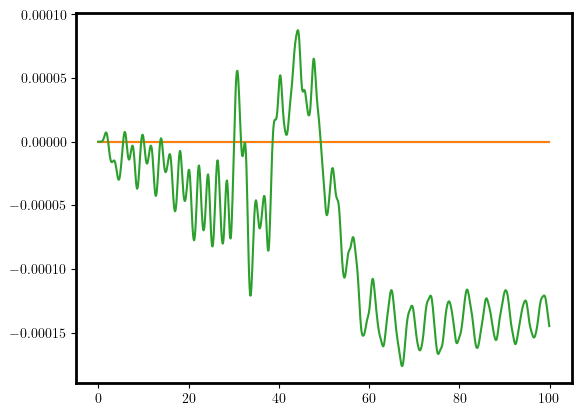

In [340]:
plt.plot(sden_sl_f[:,0], sden_sl_f[:,19])
plt.plot(sden_sl_f[:,0], sden_sl_f[:,20])
plt.plot(sden_sl_f[:,0], sden_sl_f[:,21])
#plt.plot(sden_sl_f[:,0], sden_sl_f[:,24])

In [227]:
#sden_sl_f[:,6]

3
6
9
12
15
18
21
24
27
30


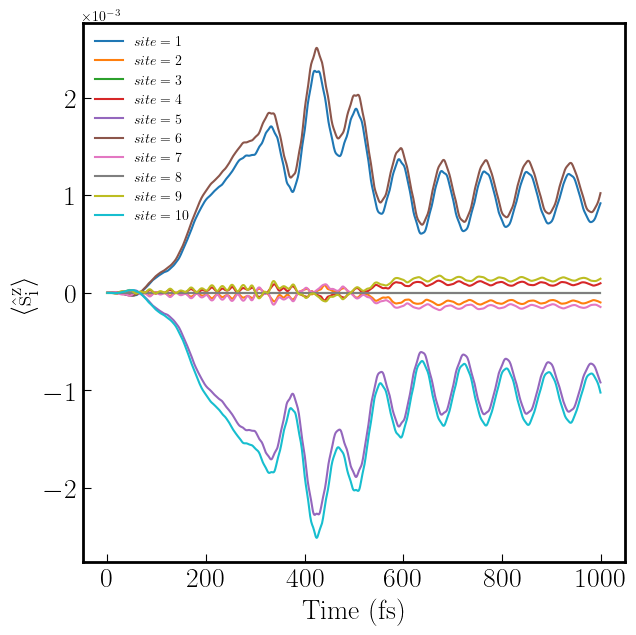

In [341]:
#sz_sden_pos = [sden_sl_f[:,i] for i in range(3,6,3) ]
#plt.plot(sden_sl_f[:,1],sz_sden_pos )
fig,axes=plt.subplots(1,1,figsize=(7,7))
fs =20
for i in range(3,31,3):
    print(i)
    plt.plot(sden_sl_f[:,i],label=f"$site={i//3}$")
plt.legend()  
axes.ticklabel_format(axis="y", style="sci", scilimits=(-1,2), useMathText=True)
axes.ticklabel_format(axis="y", style="sci", scilimits=(-1,2), useMathText=True)
axes.tick_params(axis='both', which='both', labelsize=fs,direction='in', length=6)
axes.set_ylabel(r'$\mathrm{\langle \hat s^z_i \rangle}$',fontsize=fs)
axes.set_xlabel(r'$\mathrm{Time\ (fs)}$',fontsize=fs)
#axes.set_ylim([-0.1,1.2])
axes.legend(frameon=False)

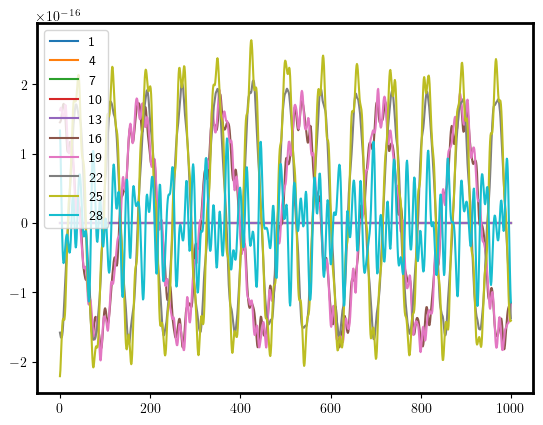

In [342]:
for i in range(1,31,3):
    plt.plot(sden_sl_f[:,i],label=f"{i}")
plt.legend()  

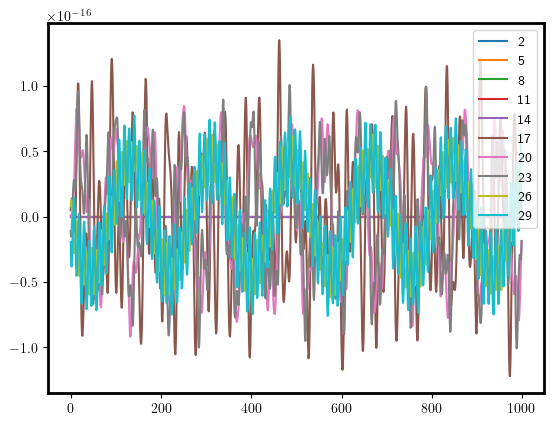

In [343]:
for i in range(2,31,3):
    plt.plot(sden_sl_f[:,i],label=f"{i}")
plt.legend()  

In [185]:
for i in range(3,31,3):
    print(i)

3
6
9
12
15
18
21
24
27
30


In [161]:
sden_sl_f.shape

(1000, 31)

In [162]:
ent_f

array([[ 0.        ,  0.33789455],
       [ 0.1       ,  0.33789455],
       [ 0.2       ,  0.33789455],
       ...,
       [99.7       ,  0.33789442],
       [99.8       ,  0.33789436],
       [99.9       ,  0.33789429]])

Text(0.5, 0, 'time')

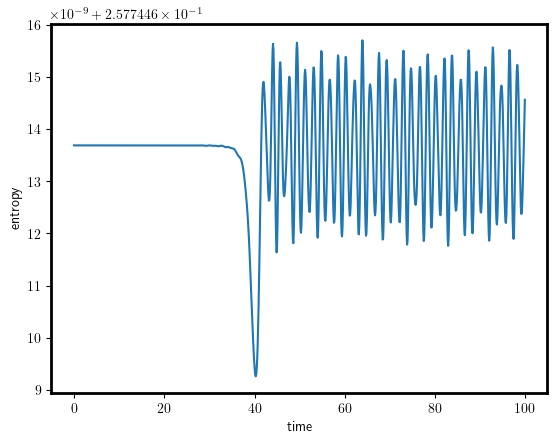

In [284]:
fig,ax = plt.subplots(1,1)
ax.plot(ent_f[:,0],ent_f[:,1])
ax.set_ylabel("entropy")
ax.set_xlabel("time")


In [704]:
range(4,3,31)

range(4, 3, 31)

In [387]:
3*np.pi/2

4.71238898038469